In [1]:
import os
import shutil
from tqdm import tqdm
directory1 = "/kaggle/working/Finger_Nails/Anemic"
directory2 = "/kaggle/working/Finger_Nails/Non-Anemic"
if not os.path.exists(directory1):
    os.makedirs(directory1)
if not os.path.exists(directory2):
    os.makedirs(directory2)


source_dir = "/kaggle/input/fingernails/Fingernails/Anemic"
for filename in tqdm(os.listdir(source_dir)):
    source_file = os.path.join(source_dir, filename)
    target_file = os.path.join(directory1, filename)
    shutil.copy(source_file, target_file)

source_dir = "/kaggle/input/fingernails/Fingernails/Non_Anemic"
for filename in tqdm(os.listdir(source_dir)):
    source_file = os.path.join(source_dir, filename)
    target_file = os.path.join(directory2, filename)
    shutil.copy(source_file, target_file)
    


100%|██████████| 1695/1695 [00:09<00:00, 180.69it/s]


In [2]:
!cd /kaggle/working/
!ls

Finger_Nails


In [3]:
BASE_PATH = "/kaggle/working/Finger_Nails"

>

# 1 Import libraries

In [4]:
%pip install -U imbalanced-learn
%pip install -U tensorflow
%pip install -U keras
%pip install -U tensorflow
%pip install -U keras
import os
import shutil
import pathlib
import PIL
import cv2
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
import random
import itertools
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model
from IPython.display import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.applications import ResNet50, DenseNet169, EfficientNetB3
from tensorflow.keras import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import InputLayer, BatchNormalization, Dropout, Conv2D, MaxPooling2D, Flatten, Dense, Activation
from tensorflow .keras.optimizers import Adam, Adamax
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.callbacks import EarlyStopping

from PIL import Image, UnidentifiedImageError

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import warnings
warnings.filterwarnings("ignore")

import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)


print("All done")

Note: you may need to restart the kernel to use updated packages.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 2.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 3.8 MB/s eta 0:00:000:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 20.6 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.2.0
    Uninstalling ml-dtypes-0.2.0:
      Successfully uninstalled ml-dtypes-0.2.0
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.15.1
    Uninstalling tensorboard-2.15.1:
      Successfully uninstalled tensorboard-2.15.1
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.15.0
    Uninstalling tensorflow-2.15.0:
      Successfully uninstalled tensorflow-2.15.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependenc

# 2 Read Data

## A- convert files to lists

In [5]:
Path_data = 'Finger_Nails/'
data = os.listdir(Path_data)
np.random.seed(42)
anemic = os.listdir(Path_data + 'Anemic')
non_anemic = os.listdir(Path_data + 'Non-Anemic')


In [6]:
print("classes names :", (data), "\n______________________________\n")
print("Number of classes :", len(data), "\n______________________________\n")
print("Number of Anemic images :", len(anemic), "\n______________________________\n")
print("Number of Non-Anemic images :", len(non_anemic), "\n______________________________\n")

classes names : ['Non-Anemic', 'Anemic'] 
______________________________

Number of classes : 2 
______________________________

Number of Anemic images : 2565 
______________________________

Number of Non-Anemic images : 1695 
______________________________



### As noticed above: data  imbalanced

## B- Create a dataframe

In [7]:
# Get Paths


# Create two lists to store paths of images and their labels

imgpaths = []
labels =[]


# Convert directory to list

data = os.listdir(Path_data)

# Get paths and Labels of classes and images in data

for i in data:
    classpath = os.path.join(Path_data, i)
    imglist = os.listdir(classpath)

    for img in imglist:
        imgpath = os.path.join(classpath, img)

        imgpaths.append(imgpath)
        labels.append(i)


# Convert two lists of imgpaths and their labels into series

Paths = pd.Series(imgpaths, name = 'Paths')
Labels = pd.Series(labels, name = 'Labels')

# Concatenate them in one Dataframe called Tr_data

df = pd.concat([Paths, Labels], axis = 1)
df.to_csv(BASE_PATH + 'df.csv', index = False)
df.head(5)

,Paths,Labels
0,Finger_Nails/Non-Anemic/Non-Anrmic-FN-027 (2).png,Non-Anemic
1,Finger_Nails/Non-Anemic/Non-Anrmic-FN-106 (5).png,Non-Anemic
2,Finger_Nails/Non-Anemic/Non-Anrmic-FN-204 (2).png,Non-Anemic
3,Finger_Nails/Non-Anemic/Non-Anrmic-FN-005 (3).png,Non-Anemic
4,Finger_Nails/Non-Anemic/Non-Anrmic-FN-152 (9).png,Non-Anemic


## Split data into train, valid, test

In [8]:
#train, valid  and test dataframes
train, testval = train_test_split(df, test_size = 0.2, shuffle = True, random_state = 123)
valid, test = train_test_split(testval, test_size = 0.5, shuffle = True, random_state = 123)

print("Train shape: ", train.shape)
print("Valid shape: ", valid.shape)
print("Test shape: ",test.shape)

test.to_csv(BASE_PATH + 'test.csv', index = False)
valid.to_csv(BASE_PATH + 'valid.csv', index = False)
train.to_csv(BASE_PATH + 'train.csv', index = False)

train.Labels.value_counts()

Train shape:  (3408, 2)
Valid shape:  (426, 2)
Test shape:  (426, 2)


Labels
Anemic        2051
Non-Anemic    1357
Name: count, dtype: int64

## C- Data Augmentation

In [9]:
batch_size = 20   # As smaller, As more data generated ....In views of data size
img_size = (224, 224) # standard value (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)


#Create generators

tr_G = ImageDataGenerator(
    zca_whitening=True,
    rotation_range=30.,
    fill_mode='nearest',
    )

V_G = ImageDataGenerator()

t_G = ImageDataGenerator()

#Generate Appropriate Data for fitting into model

Train = tr_G.flow_from_dataframe(train, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Valid = V_G.flow_from_dataframe(valid, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = True, batch_size = batch_size)
Test = t_G.flow_from_dataframe(test, x_col = 'Paths', y_col = 'Labels', target_size = img_size, class_mode = 'categorical', color_mode = 'rgb', shuffle = False, batch_size = batch_size)

Found 3408 validated image filenames belonging to 2 classes.
Found 426 validated image filenames belonging to 2 classes.
Found 426 validated image filenames belonging to 2 classes.


## D- Represent a sample

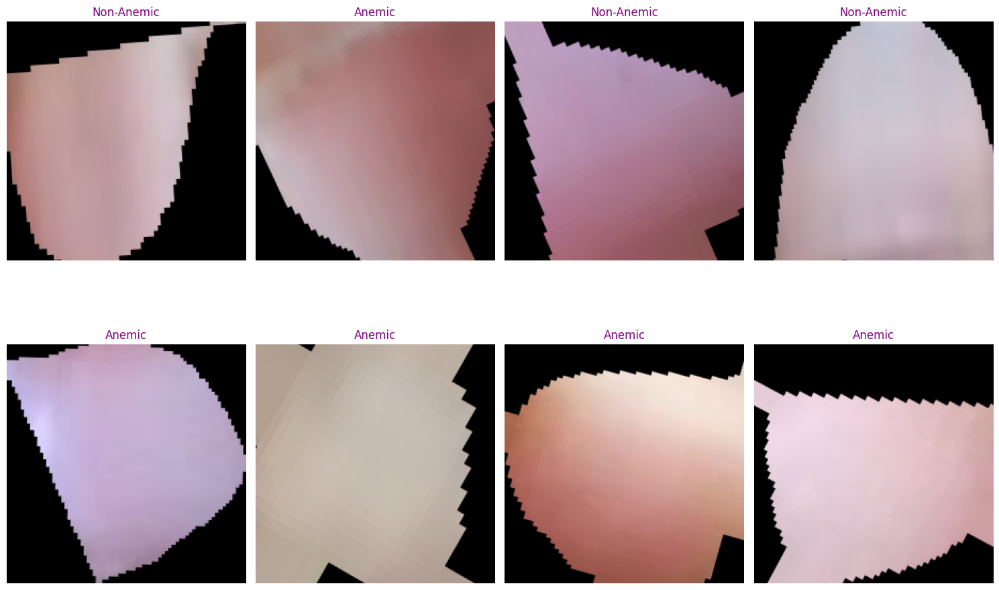

In [10]:
# Define labels and their indices as a dict
L_index = Train.class_indices
L_index

# Store Labels in a list
Keys = list(L_index.keys())
Keys

#Get a sample batch
imgs, labels = next(Train)

# Visualization
plt.figure(figsize= (15, 15))

for i in range(8):
    plt.subplot(3, 4, i +1)
    im = imgs[i]/255
    plt.imshow(im)

    #Labelling
    index = np.argmax(labels[i])
    label = Keys[index]
    plt.title(label, color = 'purple')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [11]:
#train, valid  and test dataframes
train = pd.read_csv(f"{BASE_PATH}train.csv")
valid = pd.read_csv(f"{BASE_PATH}valid.csv")
test = pd.read_csv(f"{BASE_PATH}test.csv")

train["Paths"] = train["Paths"].apply(lambda x: f"{BASE_PATH}project/{x}".replace("\\", "/"))
test["Paths"] = test["Paths"].apply(lambda x: f"{BASE_PATH}project/{x}".replace("\\", "/"))
valid["Paths"] = valid["Paths"].apply(lambda x: f"{BASE_PATH}project/{x}".replace("\\", "/"))
train.Labels.value_counts()

Labels
Anemic        2051
Non-Anemic    1357
Name: count, dtype: int64

# E- Modelling

In [12]:
# Define number of classes
num_classes = len(list(Train.class_indices.keys()))
img_shape = (img_size[0], img_size[1], 3)
EPOCHS = 50
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# 1. ResNet50

In [13]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
np.random.seed(42)
# Define base model
base_model = ResNet50(include_top=False, weights='imagenet', input_shape=(img_size[0], img_size[1], 3))

# Add custom head
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(512, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create model
ResNet50_model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
ResNet50_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [14]:
ResNet50_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,637,826 (93.99 MB)

 Trainable params: 24,584,706 (93.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

## Visualise the model

In [15]:
# Plot and display architecture for ResNet50 model
from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(ResNet50_model, to_file='ResNet50_model.png', show_shapes=True, show_layer_names=True)
Image(filename='ResNet50_model.png')

## Training the model

In [16]:
np.random.seed(42)
# Train the model
history_ResNet50 = ResNet50_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1
)

# Evaluate the model on the test set
test_loss_resnet50, test_accuracy_resnet50 = ResNet50_model.evaluate(Test)

Epoch 1/50


I0000 00:00:1716711986.336130     116 service.cc:145] XLA service 0x783f480037f0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1716711986.336176     116 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/170 ━━━━━━━━━━━━━━━━━━━━ 2:38:30 56s/step - accuracy: 0.4500 - loss: 1.0555

I0000 00:00:1716712009.676594     116 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


 66/170 ━━━━━━━━━━━━━━━━━━━━ 52s 509ms/step - accuracy: 0.5355 - loss: 1.1870

I0000 00:00:1716712042.754040     113 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'loop_add_subtract_fusion_23', 16 bytes spill stores, 16 bytes spill loads



170/170 ━━━━━━━━━━━━━━━━━━━━ 114s 342ms/step - accuracy: 0.5639 - loss: 0.9328 - val_accuracy: 0.5976 - val_loss: 0.7043
Epoch 2/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.6000 - loss: 0.6910 - val_accuracy: 0.5000 - val_loss: 0.7743
Epoch 3/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 37s 208ms/step - accuracy: 0.5919 - loss: 0.6607 - val_accuracy: 0.5952 - val_loss: 1.6283
Epoch 4/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 233us/step - accuracy: 0.7000 - loss: 0.5617 - val_accuracy: 0.6667 - val_loss: 0.6739
Epoch 5/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 37s 206ms/step - accuracy: 0.6029 - loss: 0.6572 - val_accuracy: 0.6119 - val_loss: 0.6394
Epoch 6/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 242us/step - accuracy: 0.7500 - loss: 0.5777 - val_accuracy: 0.5000 - val_loss: 0.7621
Epoch 7/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 37s 208ms/step - accuracy: 0.6336 - loss: 0.6410 - val_accuracy: 0.6429 - val_loss: 0.6318
Epoch 8/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 229us/step - accuracy: 0.8000 - loss: 0.6082 - val_acc

In [17]:
tr_acc_ResNet50 = history_ResNet50.history['accuracy']
tr_loss_ResNet50 = history_ResNet50.history['loss']
v_acc_ResNet50 = history_ResNet50.history['val_accuracy']
v_loss_ResNet50 = history_ResNet50.history['val_loss']
index_acc_ResNet50 = np.argmax(v_acc_ResNet50)
high_Vacc_ResNet50 = v_acc_ResNet50[index_acc_ResNet50]
index_loss_ResNet50 = np.argmin(v_loss_ResNet50)
low_Vloss_ResNet50 = v_loss_ResNet50[index_loss_ResNet50]
Epochs_ResNet50 = list(range(1, len(tr_acc_ResNet50) + 1))
best_acc_ResNet50 = f'Best epoch ={str(index_acc_ResNet50 + 1)}'
best_loss_ResNet50 = f'Best epoch ={str(index_loss_ResNet50 + 1)}'

In [18]:


# save the model
ResNet50_model.save(f"ResNet50_model.keras")
ResNet50_model.save(f"ResNet50_model.h5")
# save the history of the model
np.save(f"ResNet50_model_history.npy", history_ResNet50.history)

import pickle

with open(f"history_ResNet50.pickle", 'wb') as handle:
    pickle.dump(history_ResNet50.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# 2. EfficientNetB7

In [19]:

import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB7
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model



def create_model():
    pretrained_model = EfficientNetB7(include_top=False, weights='imagenet', input_shape=(img_size[0], img_size[1], 3))
    pretrained_model.trainable = True
    # Add custom head
    x = GlobalAveragePooling2D()(pretrained_model.output)
    x = Dense(512, activation='relu')(x)
    predictions = Dense(num_classes, activation='softmax')(x)
    # Create model
    EfficientNetB7_model = Model(inputs=pretrained_model.input, outputs=predictions)
    # Compile model
    EfficientNetB7_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])
    return EfficientNetB7_model




EfficientNetB7_model = create_model()



258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [20]:
EfficientNetB7_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 224, 224,  │          0 │ input_layer_1[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 224, 224,  │          7 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_1         │ (None, 224, 224,  │          0 │ normalization[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv_pad       │ (None, 225, 225,  │          0 │ rescaling_1[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 112, 112,  │      1,728 │ stem_conv_pad[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 112, 112,  │        256 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 112, 112,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_dwconv      │ (None, 112, 112,  │        576 │ stem_activation[… │
│ (DepthwiseConv2D)   │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_bn          │ (None, 112, 112,  │        256 │ block1a_dwconv[0… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_activation  │ (None, 112, 112,  │          0 │ block1a_bn[0][0]  │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_squeeze  │ (None, 64)        │          0 │ block1a_activati… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reshape  │ (None, 1, 1, 64)  │          0 │ block1a_se_squee… │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_reduce   │ (None, 1, 1, 16)  │      1,040 │ block1a_se_resha… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_expand   │ (None, 1, 1, 64)  │      1,088 │ block1a_se_reduc… │
│ (Conv2D)            │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_se_excite   │ (None, 112, 112,  │          0 │ block1a_activati… │
│ (Multiply)          │ 64)               │            │ block1a_se_expan… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 112, 112,  │      2,048 │ block1a_se_excit

 Total params: 65,409,945 (249.52 MB)

 Trainable params: 65,099,218 (248.33 MB)

 Non-trainable params: 310,727 (1.19 MB)

## Visualise the model

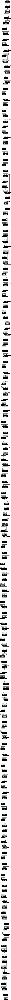

In [21]:
# Plot and display architecture for EfficientNetB7 model
from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(EfficientNetB7_model, to_file='EfficientNetB7_model.png', show_shapes=True, show_layer_names=True)
Image(filename='EfficientNetB7_model.png')

## Training the model

In [22]:
# Train the model
np.random.seed(42)
history_EfficientNetB7 = EfficientNetB7_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1
)

# Evaluate the model on the test set
test_loss_efficientnetb7, test_accuracy_efficientnetb7 = EfficientNetB7_model.evaluate(Test)

Epoch 1/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 753s 2s/step - accuracy: 0.5994 - loss: 0.7620 - val_accuracy: 0.6500 - val_loss: 0.6730
Epoch 2/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step - accuracy: 0.8500 - loss: 0.4372 - val_accuracy: 0.8333 - val_loss: 0.4568
Epoch 3/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 82s 471ms/step - accuracy: 0.6907 - loss: 0.5653 - val_accuracy: 0.5738 - val_loss: 0.7574
Epoch 4/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 1s 593us/step - accuracy: 0.7000 - loss: 0.5247 - val_accuracy: 0.6667 - val_loss: 1.0423
Epoch 5/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 82s 471ms/step - accuracy: 0.7225 - loss: 0.5429 - val_accuracy: 0.6524 - val_loss: 0.6747
Epoch 6/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 1s 646us/step - accuracy: 0.8000 - loss: 0.3812 - val_accuracy: 0.6667 - val_loss: 0.5456
Epoch 7/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 82s 471ms/step - accuracy: 0.7752 - loss: 0.4450 - val_accuracy: 0.7119 - val_loss: 0.5413
Epoch 8/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 1s 611us/step - accuracy: 0.8000 - loss: 0.3605 -

In [23]:
tr_acc_EfficientNetB7 = history_EfficientNetB7.history['accuracy']
tr_loss_EfficientNetB7 = history_EfficientNetB7.history['loss']
v_acc_EfficientNetB7 = history_EfficientNetB7.history['val_accuracy']
v_loss_EfficientNetB7 = history_EfficientNetB7.history['val_loss']
index_acc_EfficientNetB7 = np.argmax(v_acc_EfficientNetB7)
high_Vacc_EfficientNetB7 = v_acc_EfficientNetB7[index_acc_EfficientNetB7]
index_loss_EfficientNetB7 = np.argmin(v_loss_EfficientNetB7)
low_Vloss_EfficientNetB7 = v_loss_EfficientNetB7[index_loss_EfficientNetB7]
Epochs_EfficientNetB7 = list(range(1, len(tr_acc_EfficientNetB7) + 1))
best_acc_EfficientNetB7 = f'Best epoch ={str(index_acc_EfficientNetB7 + 1)}'
best_loss_EfficientNetB7 = f'Best epoch ={str(index_loss_EfficientNetB7 + 1)}'

In [24]:
# save the model
EfficientNetB7_model.save(f"EfficientNetB7_model.keras")
# save the model
EfficientNetB7_model.save(f"EfficientNetB7_model.h5")
# save the history of the model
# save the history of the model
np.save(f"EfficientNetB7_model_history.npy", history_EfficientNetB7.history)

import pickle

with open(f"history_EfficientNetB7.pickle", 'wb') as handle:
    pickle.dump(history_EfficientNetB7.history, handle, protocol=pickle.HIGHEST_PROTOCOL)


# 3. DenseNet169

In [25]:
from tensorflow.keras.applications import DenseNet169

# Define base model
base_model = DenseNet169(include_top=False, weights='imagenet', input_shape=(img_size[0], img_size[1], 3))

# Add custom head
x = GlobalAveragePooling2D()(base_model.output)
x = Dense(512, activation='relu')(x)
predictions = Dense(num_classes, activation='softmax')(x)

# Create model
DenseNet169_model = Model(inputs=base_model.input, outputs=predictions)

# Compile model
DenseNet169_model.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=['accuracy'])



51877672/51877672 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [26]:
DenseNet169_model.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 13,496,386 (51.48 MB)

 Trainable params: 13,337,986 (50.88 MB)

 Non-trainable params: 158,400 (618.75 KB)

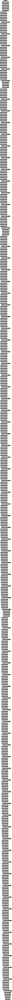

In [27]:
# Plot and display architecture for DenseNet169 model

from tensorflow.keras.utils import plot_model
from IPython.display import Image
plot_model(DenseNet169_model, to_file='DenseNet169_model.png', show_shapes=True, show_layer_names=True)
Image(filename='DenseNet169_model.png')

## Training the model

In [28]:
np.random.seed(42)
# Train the model
history_DenseNet169 = DenseNet169_model.fit(
    Train,
    steps_per_epoch=Train.samples // batch_size,
    epochs=EPOCHS,
    validation_data=Valid,
    validation_steps=Valid.samples // batch_size,
    verbose=1
)

# Evaluate the model on the test set
test_loss_densenet169, test_accuracy_densenet169 = DenseNet169_model.evaluate(Test)

Epoch 1/50


I0000 00:00:1716716015.481631     115 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_slice_fusion_1', 12 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_42', 8 bytes spill stores, 48 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_762', 4 bytes spill stores, 28 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_37', 4 bytes spill stores, 4 bytes spill loads



111/170 ━━━━━━━━━━━━━━━━━━━━ 12s 214ms/step - accuracy: 0.5290 - loss: 1.0738

I0000 00:00:1716716179.639016     113 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_19', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_20', 4 bytes spill stores, 4 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_21', 8 bytes spill stores, 8 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_22', 12 bytes spill stores, 12 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_23', 16 bytes spill stores, 16 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_slice_fusion', 2096 bytes spill stores, 2068 bytes spill loads
ptxas warning : Registers are spilled to local memory in function 'input_compare_reduce_fusion_20', 8 bytes spill st

170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5506 - loss: 0.9620

I0000 00:00:1716716205.036183     113 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion_1', 8 bytes spill stores, 8 bytes spill loads



170/170 ━━━━━━━━━━━━━━━━━━━━ 412s 1s/step - accuracy: 0.5509 - loss: 0.9607 - val_accuracy: 0.6024 - val_loss: 1.4972
Epoch 2/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 13s 76ms/step - accuracy: 0.6000 - loss: 0.6342 - val_accuracy: 0.1667 - val_loss: 2.8521
Epoch 3/50


I0000 00:00:1716716218.911251     116 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 8 bytes spill stores, 8 bytes spill loads



170/170 ━━━━━━━━━━━━━━━━━━━━ 39s 221ms/step - accuracy: 0.5754 - loss: 0.6698 - val_accuracy: 0.5333 - val_loss: 0.6834
Epoch 4/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 423us/step - accuracy: 0.7000 - loss: 0.6352 - val_accuracy: 0.6667 - val_loss: 0.6725
Epoch 5/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 39s 221ms/step - accuracy: 0.6243 - loss: 0.6558 - val_accuracy: 0.5714 - val_loss: 0.7615
Epoch 6/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 446us/step - accuracy: 0.7500 - loss: 0.5359 - val_accuracy: 0.6667 - val_loss: 0.6979
Epoch 7/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 39s 219ms/step - accuracy: 0.6115 - loss: 0.6690 - val_accuracy: 0.5976 - val_loss: 0.8570
Epoch 8/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 440us/step - accuracy: 0.7500 - loss: 0.5665 - val_accuracy: 0.6667 - val_loss: 0.7461
Epoch 9/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 39s 222ms/step - accuracy: 0.6548 - loss: 0.6341 - val_accuracy: 0.5976 - val_loss: 0.7076
Epoch 10/50
170/170 ━━━━━━━━━━━━━━━━━━━━ 0s 422us/step - accuracy: 0.3500 - loss: 0.8046 - val_ac

In [29]:
tr_acc_DenseNet169 = history_DenseNet169.history['accuracy']
tr_loss_DenseNet169 = history_DenseNet169.history['loss']
v_acc_DenseNet169 = history_DenseNet169.history['val_accuracy']
v_loss_DenseNet169 = history_DenseNet169.history['val_loss']
index_acc_DenseNet169 = np.argmax(v_acc_DenseNet169)
high_Vacc_DenseNet169 = v_acc_DenseNet169[index_acc_DenseNet169]
index_loss_DenseNet169 = np.argmin(v_loss_DenseNet169)
low_Vloss_DenseNet169 = v_loss_DenseNet169[index_loss_DenseNet169]
Epochs_DenseNet169 = list(range(1, len(tr_acc_DenseNet169) + 1))
best_acc_DenseNet169 = f'Best epoch ={str(index_acc_DenseNet169 + 1)}'
best_loss_DenseNet169 = f'Best epoch ={str(index_loss_DenseNet169 + 1)}'

In [51]:
# save the model
DenseNet169_model.save(f"DenseNet169_model.h5")
DenseNet169_model.save(f"DenseNet169_model.keras")
# save the history of the model
np.save(f"DenseNet169_model_history.npy", history_DenseNet169.history)

import pickle

with open(f"history_DenseNet169.pickle", 'wb') as handle:
    pickle.dump(history_DenseNet169.history, handle, protocol=pickle.HIGHEST_PROTOCOL)

# Comparision

# 1. ResNet50

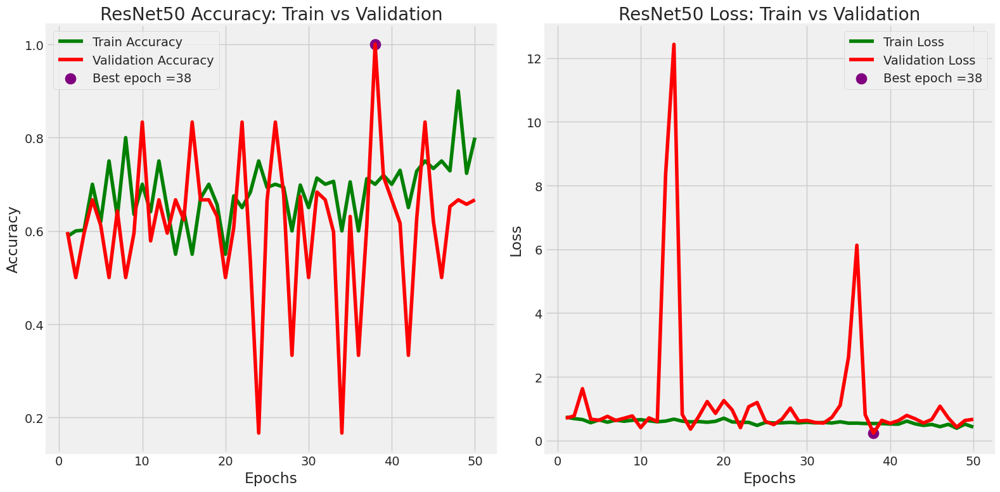

In [32]:

# Plotting for ResNet50 model
plt.figure(figsize=(16, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs_ResNet50, tr_acc_ResNet50, "g", label="Train Accuracy")
plt.plot(Epochs_ResNet50, v_acc_ResNet50, "r", label="Validation Accuracy")
plt.scatter(index_acc_ResNet50 + 1, high_Vacc_ResNet50, s=150, color='purple', label=best_acc_ResNet50)
plt.title("ResNet50 Accuracy: Train vs Validation")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_ResNet50, tr_loss_ResNet50, "g", label="Train Loss")
plt.plot(Epochs_ResNet50, v_loss_ResNet50, "r", label="Validation Loss")
plt.scatter(index_loss_ResNet50 + 1, low_Vloss_ResNet50, s=150, color='purple', label=best_loss_ResNet50)
plt.title("ResNet50 Loss: Train vs Validation")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [33]:
# Evaluate ResNet5050 model
test_scores_ResNet50 = ResNet50_model.evaluate(Test, verbose=1)

# Print scores for ResNet5050 model
print('ResNet50 Model Scores:')
print('Test Accuracy:', test_scores_ResNet50[1])
print('Test Loss:', test_scores_ResNet50[0])


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.6789 - loss: 0.6743
ResNet50 Model Scores:
Test Accuracy: 0.6877934336662292
Test Loss: 0.6340065002441406


# 2. EfficientNetB7

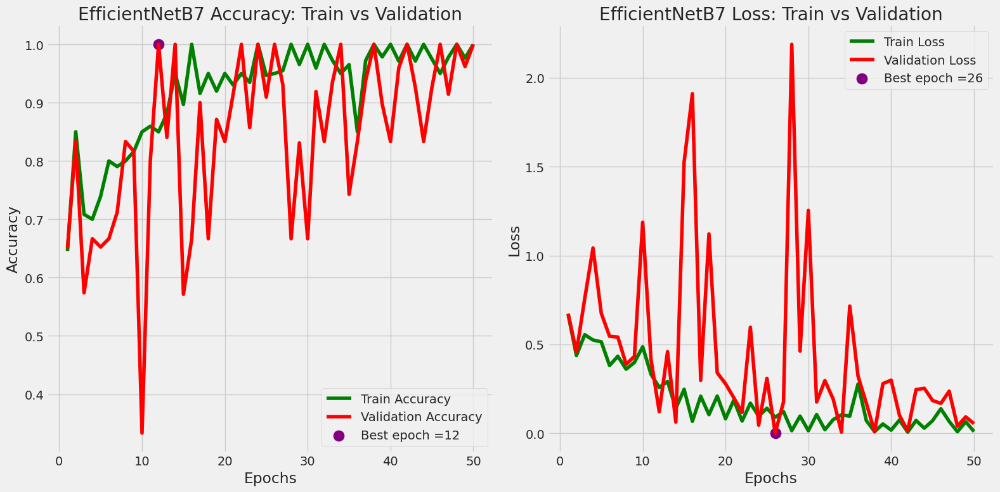

In [34]:
# Plotting for EfficientNetB7B3 model
plt.figure(figsize=(16, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs_EfficientNetB7, tr_acc_EfficientNetB7, "g", label="Train Accuracy")
plt.plot(Epochs_EfficientNetB7, v_acc_EfficientNetB7, "r", label="Validation Accuracy")
plt.scatter(index_acc_EfficientNetB7 + 1, high_Vacc_EfficientNetB7, s=150, color='purple', label=best_acc_EfficientNetB7)
plt.title("EfficientNetB7 Accuracy: Train vs Validation")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_EfficientNetB7, tr_loss_EfficientNetB7, "g", label="Train Loss")
plt.plot(Epochs_EfficientNetB7, v_loss_EfficientNetB7, "r", label="Validation Loss")
plt.scatter(index_loss_EfficientNetB7 + 1, low_Vloss_EfficientNetB7, s=150, color='purple', label=best_loss_EfficientNetB7)
plt.title("EfficientNetB7 Loss: Train vs Validation")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [35]:
# Evaluate EfficientNetB7 model
test_scores_efficientnet = EfficientNetB7_model.evaluate(Test, verbose=1)

# Print scores for EfficientNetB3 model
print('EfficientNetB7 Model Scores:')
print('Test Accuracy:', test_scores_efficientnet[1])
print('Test Loss:', test_scores_efficientnet[0])


22/22 ━━━━━━━━━━━━━━━━━━━━ 3s 112ms/step - accuracy: 0.9670 - loss: 0.0973
EfficientNetB7 Model Scores:
Test Accuracy: 0.9624413251876831
Test Loss: 0.10574061423540115


# 3. DenseNet169

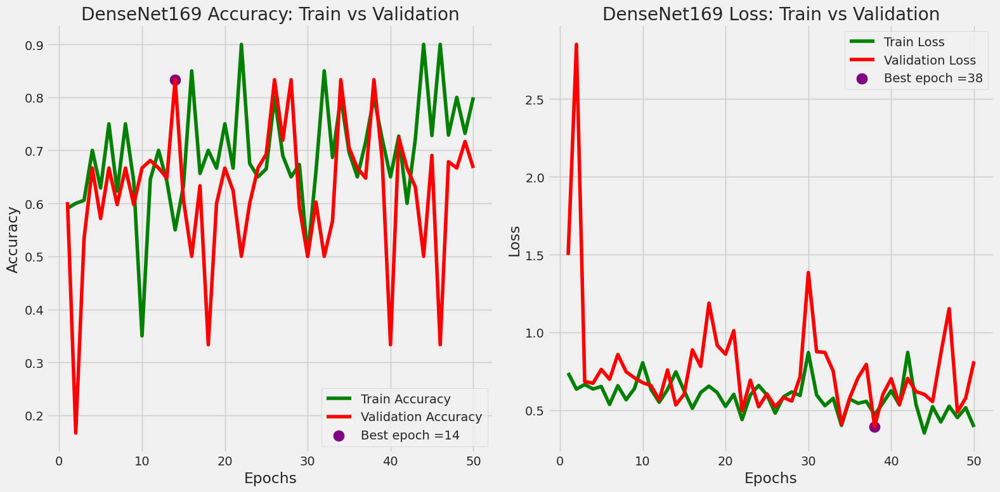

In [36]:
# Plotting for DenseNet169 model
plt.figure(figsize=(16, 8))
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 1)
plt.plot(Epochs_DenseNet169, tr_acc_DenseNet169, "g", label="Train Accuracy")
plt.plot(Epochs_DenseNet169, v_acc_DenseNet169, "r", label="Validation Accuracy")
plt.scatter(index_acc_DenseNet169 + 1, high_Vacc_DenseNet169, s=150, color='purple', label=best_acc_DenseNet169)
plt.title("DenseNet169 Accuracy: Train vs Validation")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(Epochs_DenseNet169, tr_loss_DenseNet169, "g", label="Train Loss")
plt.plot(Epochs_DenseNet169, v_loss_DenseNet169, "r", label="Validation Loss")
plt.scatter(index_loss_DenseNet169 + 1, low_Vloss_DenseNet169, s=150, color='purple', label=best_loss_DenseNet169)
plt.title("DenseNet169 Loss: Train vs Validation")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


In [37]:
# Evaluate DenseNet169 model

test_scores_densenet = DenseNet169_model.evaluate(Test, verbose=1)

# Print scores for DenseNet169 model
print('DenseNet169 Model Scores:')
print('Test Accuracy:', test_scores_densenet[1])
print('Test Loss:', test_scores_densenet[0])


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 54ms/step - accuracy: 0.7056 - loss: 0.6399
DenseNet169 Model Scores:
Test Accuracy: 0.7323943376541138
Test Loss: 0.59536212682724


In [38]:


models = {
    "ResNet": ResNet50_model,
    "DenseNet": DenseNet169_model,
    "EfficientNetB7": EfficientNetB7_model
}

# Dictionary to store test results for each model
test_results = {}

# Loop through each model and evaluate it
for model_name, model in models.items():
    # Evaluate the model
    scores = model.evaluate(Test, verbose=1)

    # Store test results in the dictionary
    test_results[model_name] = {
        "accuracy": scores[1],
        "loss": scores[0]
    }

# Print test metrics for each model
for model_name, metrics in test_results.items():
    print(f"\n\n{model_name} Test Metrics:")
    print("  Accuracy:", metrics['accuracy'])
    print("  Loss:", metrics['loss'])

22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - accuracy: 0.6789 - loss: 0.6743
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 53ms/step - accuracy: 0.7056 - loss: 0.6399
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 111ms/step - accuracy: 0.9670 - loss: 0.0973


ResNet Test Metrics:
  Accuracy: 0.6877934336662292
  Loss: 0.6340065002441406


DenseNet Test Metrics:
  Accuracy: 0.7323943376541138
  Loss: 0.59536212682724


EfficientNetB7 Test Metrics:
  Accuracy: 0.9624413251876831
  Loss: 0.10574061423540115


In [39]:
# Evaluate each model on the test set
test_accs = {
    "ResNet50_model": ResNet50_model.evaluate(Test)[1],
    "DenseNet169_model": DenseNet169_model.evaluate(Test)[1],
    "EfficientNetB7_model": EfficientNetB7_model.evaluate(Test)[1]
}

# Find the model with the highest test accuracy
best_model_name = max(test_accs, key=test_accs.get)
best_test_accuracy = test_accs[best_model_name]

# Print results
print("Test Accuracies:")
for model_name, test_acc in test_accs.items():
    print(model_name + ":", test_acc)
print("\nBest Model Based on Test Accuracy:", best_model_name)
print("Test Accuracy of Best Model:", best_test_accuracy)


22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - accuracy: 0.6789 - loss: 0.6743
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 49ms/step - accuracy: 0.7056 - loss: 0.6399
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 109ms/step - accuracy: 0.9670 - loss: 0.0973
Test Accuracies:
ResNet50_model: 0.6877934336662292
DenseNet169_model: 0.7323943376541138
EfficientNetB7_model: 0.9624413251876831

Best Model Based on Test Accuracy: EfficientNetB7_model
Test Accuracy of Best Model: 0.9624413251876831


In [40]:
models = {
    ResNet50_model: "ResNet50",
    DenseNet169_model: "DenseNet169",
    EfficientNetB7_model: "EfficientNetB7"
}

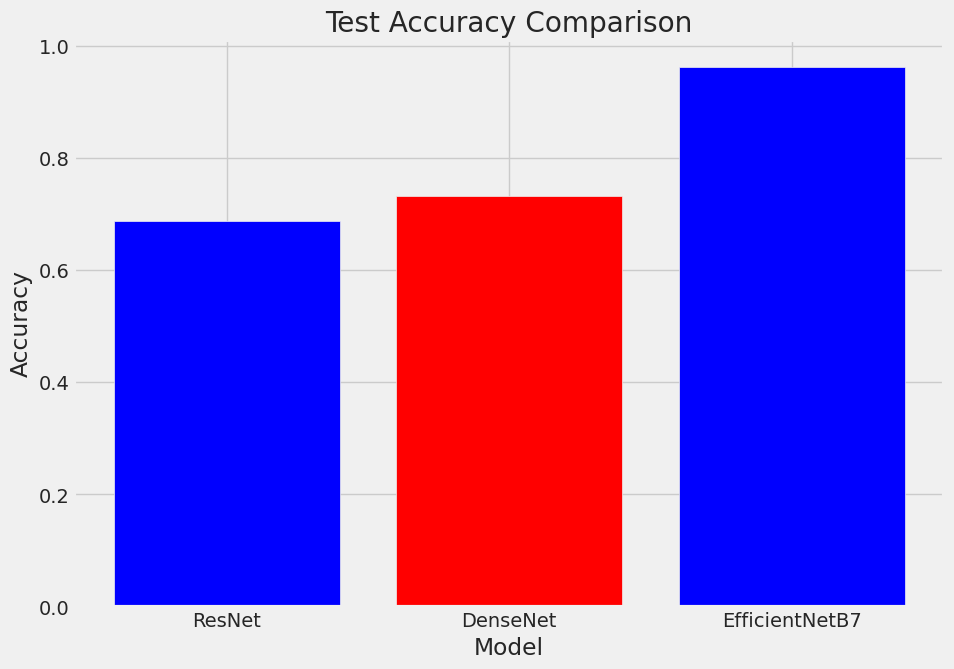

In [41]:
accuracies = [test_results[model_name]["accuracy"] for model_name in test_results]
model_names = list(test_results.keys())

# Create a bar plot
plt.figure(figsize=(10, 7))
plt.bar(model_names, accuracies, color=['blue', 'red'])
plt.title("Test Accuracy Comparison")
plt.xlabel("Model")
plt.ylabel("Accuracy")
plt.show()



In [42]:
from sklearn.metrics import confusion_matrix
import itertools
classes = list(Test.class_indices.keys())
# Function to plot confusion matrix
def plot_confusion_matrix(cm, classes, title='Confusion Matrix', cmap=plt.cm.Greens):
    plt.figure(figsize=(8, 8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "red")
    plt.tight_layout()
    plt.xlabel('Predictions')
    plt.ylabel('Real Values')
    plt.show()



# Confusion Matrix and Classification Report

# ResNet50

22/22 ━━━━━━━━━━━━━━━━━━━━ 7s 181ms/step


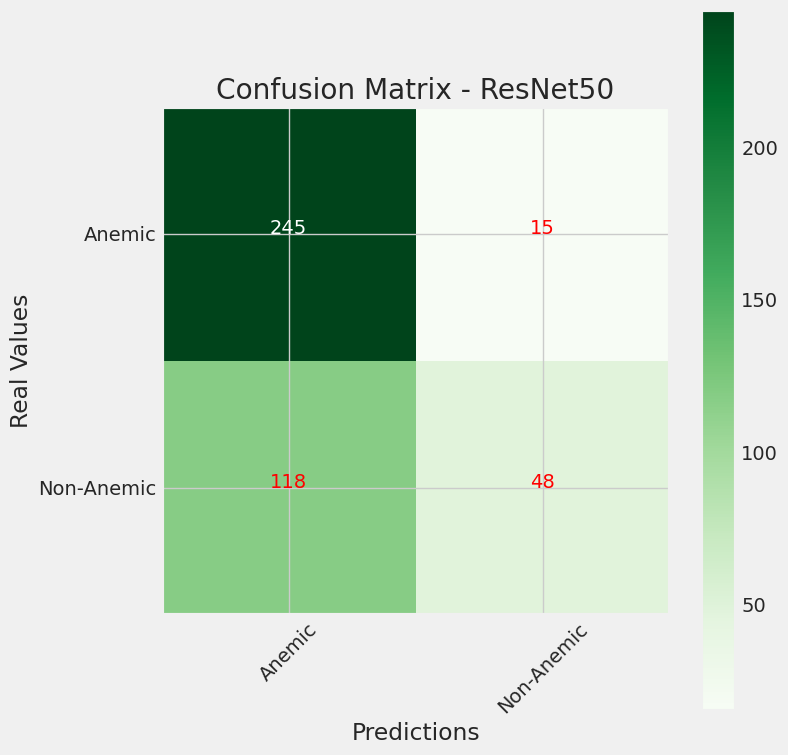

In [43]:
# Get predictions for ResNet50 model
y_pred_resnet = ResNet50_model.predict(Test)

# Calculate confusion matrix for ResNet50
cm_resnet = confusion_matrix(Test.classes, np.argmax(y_pred_resnet, axis=1))

# Plot confusion matrix for ResNet50
plot_confusion_matrix(cm_resnet, classes, title='Confusion Matrix - ResNet50')

# plot_roc_curve(Test.classes, y_pred_resnet)


In [44]:
report = classification_report(Test.classes, np.argmax(y_pred_resnet, axis=1), target_names=classes)
print(f"Classification Report - ResNet50:\n", report)

Classification Report - ResNet50:
               precision    recall  f1-score   support

      Anemic       0.67      0.94      0.79       260
  Non-Anemic       0.76      0.29      0.42       166

    accuracy                           0.69       426
   macro avg       0.72      0.62      0.60       426
weighted avg       0.71      0.69      0.64       426



# EfficientNetB7

22/22 ━━━━━━━━━━━━━━━━━━━━ 30s 756ms/step


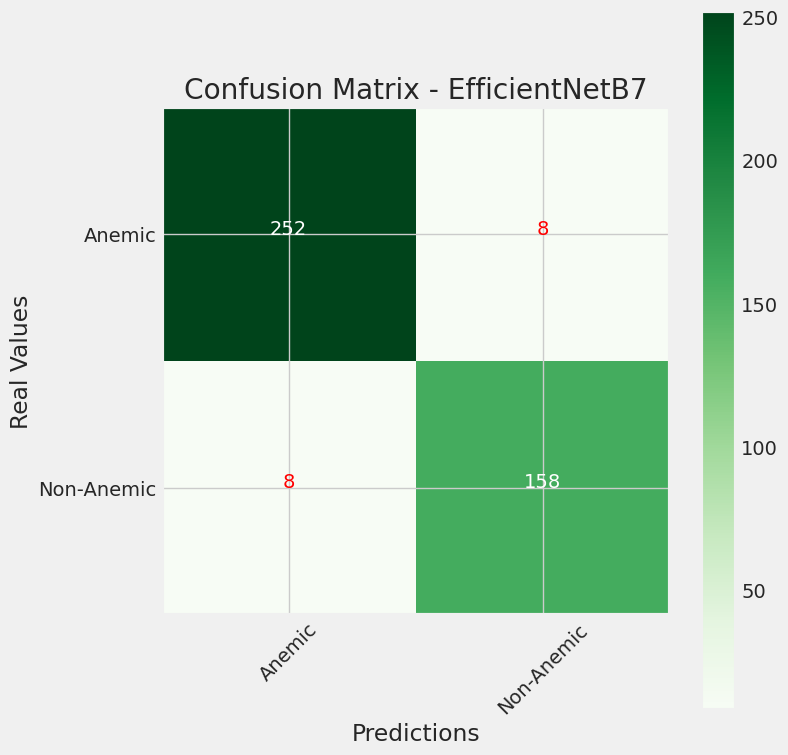

In [45]:
# Get predictions for EfficientNetB7 model
y_pred_efficientnet = EfficientNetB7_model.predict(Test)

# Calculate confusion matrix for EfficientNetB7
cm_efficientnet = confusion_matrix(Test.classes, np.argmax(y_pred_efficientnet, axis=1))

# Plot confusion matrix for EfficientNetB7
plot_confusion_matrix(cm_efficientnet, classes, title='Confusion Matrix - EfficientNetB7')


In [46]:
report = classification_report(Test.classes, np.argmax(y_pred_efficientnet, axis=1), target_names=classes)
print(f"Classification Report - EfficientNetB7:\n", report)

Classification Report - EfficientNetB7:
               precision    recall  f1-score   support

      Anemic       0.97      0.97      0.97       260
  Non-Anemic       0.95      0.95      0.95       166

    accuracy                           0.96       426
   macro avg       0.96      0.96      0.96       426
weighted avg       0.96      0.96      0.96       426



# DenseNet169

 3/22 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step 

I0000 00:00:1716717238.715187     116 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 8 bytes spill stores, 8 bytes spill loads



22/22 ━━━━━━━━━━━━━━━━━━━━ 26s 643ms/step


I0000 00:00:1716717252.216736     113 asm_compiler.cc:369] ptxas warning : Registers are spilled to local memory in function 'input_reduce_fusion', 8 bytes spill stores, 8 bytes spill loads



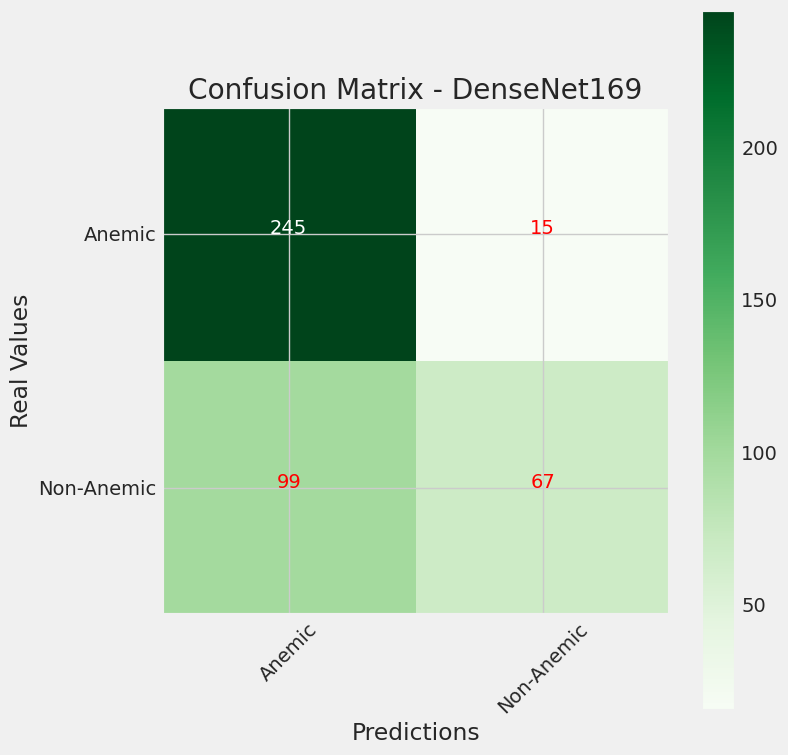

In [47]:
# Get predictions for DenseNet169 model
y_pred_densenet = DenseNet169_model.predict(Test)

# Calculate confusion matrix for DenseNet169
cm_densenet = confusion_matrix(Test.classes, np.argmax(y_pred_densenet, axis=1))

# Plot confusion matrix for DenseNet169
plot_confusion_matrix(cm_densenet, classes, title='Confusion Matrix - DenseNet169')

# plot_roc_curve(Test.classes, y_pred_densenet)


In [48]:
report = classification_report(Test.classes, np.argmax(y_pred_densenet, axis=1), target_names=classes)
print(f"Classification Report - DenseNet169:\n", report)

Classification Report - DenseNet169:
               precision    recall  f1-score   support

      Anemic       0.71      0.94      0.81       260
  Non-Anemic       0.82      0.40      0.54       166

    accuracy                           0.73       426
   macro avg       0.76      0.67      0.68       426
weighted avg       0.75      0.73      0.71       426



In [49]:
!zip -r file.zip /kaggle/working/

  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/DenseNet169_model.keras (deflated 14%)
  adding: kaggle/working/DenseNet169_model.h5 (deflated 14%)
  adding: kaggle/working/EfficientNetB7_model.h5 (deflated 8%)
  adding: kaggle/working/Finger_Nailsvalid.csv (deflated 92%)
  adding: kaggle/working/DenseNet169_model_history.npy (deflated 51%)
  adding: kaggle/working/Finger_Nailsdf.csv (deflated 94%)
  adding: kaggle/working/ResNet50_model.h5 (deflated 12%)
  adding: kaggle/working/Finger_Nailstest.csv (deflated 92%)
  adding: kaggle/working/EfficientNetB7_model_history.npy (deflated 50%)
  adding: kaggle/working/ResNet50_model.keras (deflated 12%)
  adding: kaggle/working/Finger_Nails/ (stored 0%)
  adding: kaggle/working/Finger_Nails/Non-Anemic/ (stored 0%)
  adding: kaggle/working/Finger_Nails/Non-Anemic/Non-Anrmic-FN-027 (2).png (stored 0%)
  adding: kaggle/working/Finger_Nails/Non-Anemic/Non-Anrmic-FN-106 (5).png (stored 0%)
  adding: kaggle/working/Finger_Nails/Non-A

In [50]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip